## Problem Statement

## Importing libraries / Read data

In [1]:
import pandas as pd
import numpy as np
from matplotlib import rcParams
rcParams['figure.figsize'] = 10, 10
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv('ola_driver.csv')

In [4]:
pd.set_option('display.max_rows', None)

## Shape of the data

In [5]:
df.shape

(19104, 14)

## Number and data types of variables

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19104 entries, 0 to 19103
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            19104 non-null  int64  
 1   MMM-YY                19104 non-null  object 
 2   Driver_ID             19104 non-null  int64  
 3   Age                   19043 non-null  float64
 4   Gender                19052 non-null  float64
 5   City                  19104 non-null  object 
 6   Education_Level       19104 non-null  int64  
 7   Income                19104 non-null  int64  
 8   Dateofjoining         19104 non-null  object 
 9   LastWorkingDate       1616 non-null   object 
 10  Joining Designation   19104 non-null  int64  
 11  Grade                 19104 non-null  int64  
 12  Total Business Value  19104 non-null  int64  
 13  Quarterly Rating      19104 non-null  int64  
dtypes: float64(2), int64(8), object(4)
memory usage: 2.0+ MB


In [7]:
df.head()

,Unnamed: 0,MMM-YY,Driver_ID,Age,Gender,City,Education_Level,Income,Dateofjoining,LastWorkingDate,Joining Designation,Grade,Total Business Value,Quarterly Rating
0,0,01-01-2019,1,28.0,0.0,C23,2,57387,24-12-2018,NaN,1,1,2381060,2
1,1,02-01-2019,1,28.0,0.0,C23,2,57387,24-12-2018,NaN,1,1,-665480,2
2,2,03-01-2019,1,28.0,0.0,C23,2,57387,24-12-2018,03-11-2019,1,1,0,2
3,3,11-01-2020,2,31.0,0.0,C7,2,67016,11-06-2020,NaN,2,2,0,1
4,4,12-01-2020,2,31.0,0.0,C7,2,67016,11-06-2020,NaN,2,2,0,1


In [8]:
"""remove unnecessary columns"""
df = df.drop(['Unnamed: 0'], axis=1)

In [9]:
df1 = df.copy()

In [10]:
df2 = df.copy()

In [11]:
''' Renaming column names '''
df1.columns = ['Reporting_Date','Driver_ID','Age','Gender','City','Education_Level','Income','Joining_Date',
              'Last_Working_Date','Designation','Grade','Total_Business_value','Quarterly_Rating']

In [12]:
df1.columns

Index(['Reporting_Date', 'Driver_ID', 'Age', 'Gender', 'City',
       'Education_Level', 'Income', 'Joining_Date', 'Last_Working_Date',
       'Designation', 'Grade', 'Total_Business_value', 'Quarterly_Rating'],
      dtype='object')

### Convert date-like features to their respective data type

In [13]:
df1['Reporting_Date'] = pd.to_datetime(df1['Reporting_Date'])
df1['Joining_Date'] = pd.to_datetime(df1['Joining_Date'])
df1['Last_Working_Date'] = pd.to_datetime(df1['Last_Working_Date'])

In [14]:
#df['LWD_year'] = df['Last_Working_Date'].dt.year

In [15]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19104 entries, 0 to 19103
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Reporting_Date        19104 non-null  datetime64[ns]
 1   Driver_ID             19104 non-null  int64         
 2   Age                   19043 non-null  float64       
 3   Gender                19052 non-null  float64       
 4   City                  19104 non-null  object        
 5   Education_Level       19104 non-null  int64         
 6   Income                19104 non-null  int64         
 7   Joining_Date          19104 non-null  datetime64[ns]
 8   Last_Working_Date     1616 non-null   datetime64[ns]
 9   Designation           19104 non-null  int64         
 10  Grade                 19104 non-null  int64         
 11  Total_Business_value  19104 non-null  int64         
 12  Quarterly_Rating      19104 non-null  int64         
dtypes: datetime64[ns

### Convert numeric features to their respective data types

In [16]:
#df['LWD_year'].replace(['nan','2019.0','2020.0','2018.0'],[np.nan,'1','1','1'],inplace=True)

In [17]:
df1['Gender'] = df1['Gender'].astype(str)

In [18]:
df1['Gender'].unique()

array(['0.0', '1.0', 'nan'], dtype=object)

In [19]:
df1['Gender'].replace(['0.0','1.0','nan'],['male','female',np.nan],inplace=True)

In [20]:
df1['Education_Level'] = df1['Education_Level'].astype(str)
df1['Designation'] = df1['Designation'].astype(str)
df1['Grade'] = df1['Grade'].astype(str)
df1['Quarterly_Rating'] = df1['Quarterly_Rating'].astype(str)

### Five point summary (Statistical summary) - Numeric variables

In [21]:
#Categorical variables and numerical variables
numeric_df1 = df1.select_dtypes(include=[np.number])
categorical_df1 = df1.select_dtypes(exclude=[np.number])

In [22]:
numeric_df1.describe()

,Driver_ID,Age,Income,Total_Business_value
count,19104.000000,19043.000000,19104.000000,1.910400e+04
mean,1415.591133,34.668435,65652.025126,5.716621e+05
std,810.705321,6.257912,30914.515344,1.128312e+06
min,1.000000,21.000000,10747.000000,-6.000000e+06
25%,710.000000,30.000000,42383.000000,0.000000e+00
50%,1417.000000,34.000000,60087.000000,2.500000e+05
75%,2137.000000,39.000000,83969.000000,6.997000e+05
max,2788.000000,58.000000,188418.000000,3.374772e+07


#### Five point summary (Statistical summary) - Categorical variables

In [23]:
categorical_df1.describe()

,Reporting_Date,Gender,City,Education_Level,Joining_Date,Last_Working_Date,Designation,Grade,Quarterly_Rating
count,19104,19052,19104,19104,19104,1616,19104,19104,19104
unique,24,2,29,3,869,493,5,5,4
top,2019-01-01 00:00:00,male,C20,1,2015-07-23 00:00:00,2020-07-29 00:00:00,1,2,1
freq,1022,11074,1008,6864,192,70,9831,6627,7679
first,2019-01-01 00:00:00,NaN,NaN,NaN,2013-04-01 00:00:00,2018-12-31 00:00:00,NaN,NaN,NaN
last,2020-12-01 00:00:00,NaN,NaN,NaN,2020-12-28 00:00:00,2020-12-28 00:00:00,NaN,NaN,NaN


### Non-Graphical Analysis: Value counts and unique attributes

In [24]:
categorical_df1.columns

Index(['Reporting_Date', 'Gender', 'City', 'Education_Level', 'Joining_Date',
       'Last_Working_Date', 'Designation', 'Grade', 'Quarterly_Rating'],
      dtype='object')

In [25]:
print("Gender:", categorical_df1['Gender'].unique().tolist())
print("City:", categorical_df1['City'].unique().tolist())
print("Education_Level:", categorical_df1['Education_Level'].unique().tolist())
print("Designation:", categorical_df1['Designation'].unique().tolist())
print("Grade:", categorical_df1['Grade'].unique().tolist())
print("Quarterly_Rating:", categorical_df1['Quarterly_Rating'].unique().tolist())

Gender: ['male', 'female', nan]
City: ['C23', 'C7', 'C13', 'C9', 'C11', 'C2', 'C19', 'C26', 'C20', 'C17', 'C29', 'C10', 'C24', 'C14', 'C6', 'C28', 'C5', 'C18', 'C27', 'C15', 'C8', 'C25', 'C21', 'C1', 'C4', 'C3', 'C16', 'C22', 'C12']
Education_Level: ['2', '0', '1']
Designation: ['1', '2', '3', '4', '5']
Grade: ['1', '2', '3', '4', '5']
Quarterly_Rating: ['2', '1', '4', '3']


In [26]:
for column in categorical_df1[['Gender', 'City', 'Education_Level','Designation','Grade','Quarterly_Rating']]:
    print(column.upper(),': ',categorical_df1[column].nunique())
    #print(categorical_df[column].value_counts().sort_values(ascending = False))
    print('\n')

GENDER :  2


CITY :  29


EDUCATION_LEVEL :  3


DESIGNATION :  5


GRADE :  5


QUARTERLY_RATING :  4




## Visual Analysis - Univariate, Bivariate after pre-processing of the data

## Univariate analysis

### For continuous variable(s): Distplot, countplot, histogram for univariate analysis

In [27]:
numeric_df1.columns

Index(['Driver_ID', 'Age', 'Income', 'Total_Business_value'], dtype='object')

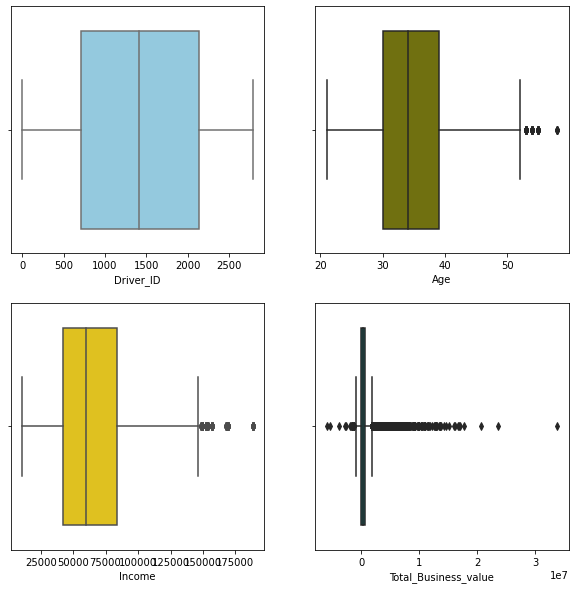

In [28]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

sns.boxplot(data=numeric_df1, x="Driver_ID", color="skyblue", ax=axs[0, 0])
sns.boxplot(data=numeric_df1, x="Age", color="olive", ax=axs[0, 1])
sns.boxplot(data=numeric_df1, x="Income", color="gold", ax=axs[1, 0])
sns.boxplot(data=numeric_df1, x="Total_Business_value", color="teal", ax=axs[1, 1])

### Histogram with distribution curve

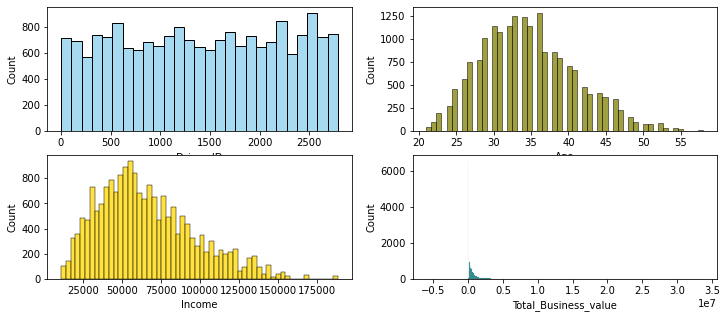

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(12, 5))

sns.histplot(data=numeric_df1, x="Driver_ID", color="skyblue", ax=axs[0, 0])
sns.histplot(data=numeric_df1, x="Age", color="olive", ax=axs[0, 1])
sns.histplot(data=numeric_df1, x="Income", color="gold", ax=axs[1, 0])
sns.histplot(data=numeric_df1, x="Total_Business_value", color="teal", ax=axs[1, 1])

### Count plot

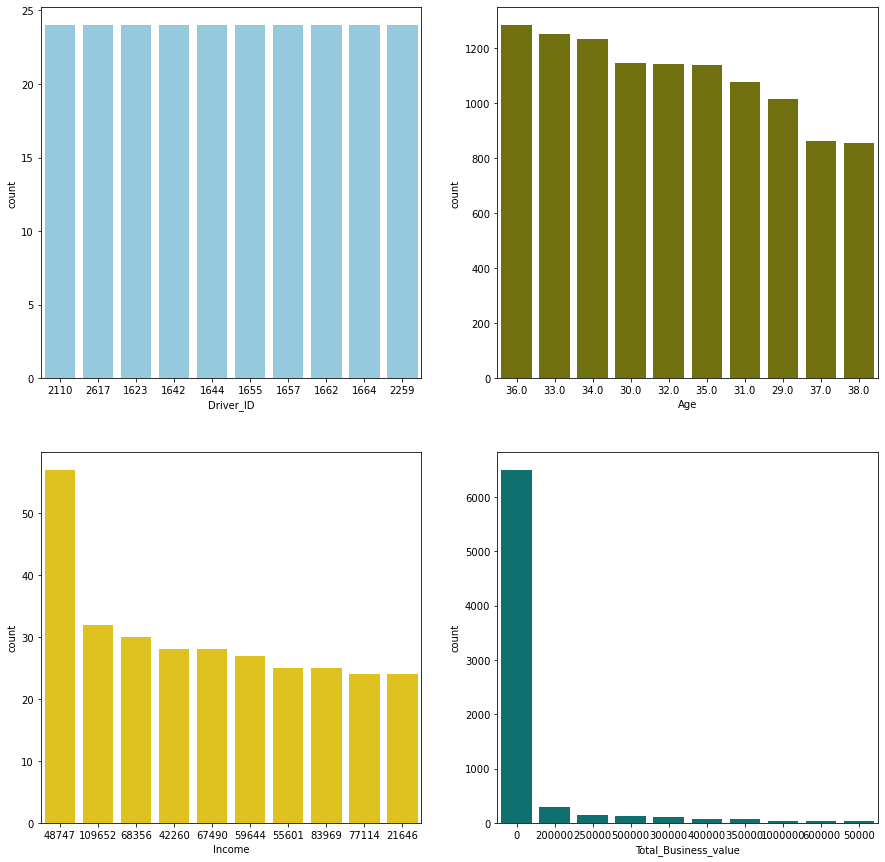

In [30]:
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

sns.countplot(data=numeric_df1, x="Driver_ID", color="skyblue", ax=axs[0, 0], order = numeric_df1['Driver_ID'].value_counts().iloc[:10].index)
sns.countplot(data=numeric_df1, x="Age", color="olive", ax=axs[0, 1],order = numeric_df1['Age'].value_counts().iloc[:10].index)
sns.countplot(data=numeric_df1, x="Income", color="gold", ax=axs[1, 0],order = numeric_df1['Income'].value_counts().iloc[:10].index)
sns.countplot(data=numeric_df1, x="Total_Business_value", color="teal", ax=axs[1, 1],order = numeric_df1['Total_Business_value'].value_counts().iloc[:10].index)

## For categorical variable(s): countplot, piechart, barplot

In [32]:
# categorical variales
categorical_df1.columns

Index(['Reporting_Date', 'Gender', 'City', 'Education_Level', 'Joining_Date',
       'Last_Working_Date', 'Designation', 'Grade', 'Quarterly_Rating'],
      dtype='object')

### Barplot with counts

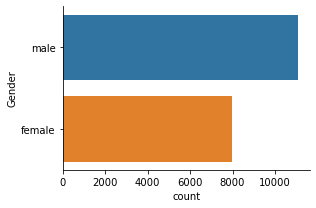

In [33]:
sns.catplot(y='Gender', kind='count', height=3, aspect=1.5, order = categorical_df1['Gender'].value_counts().index,data=categorical_df1)

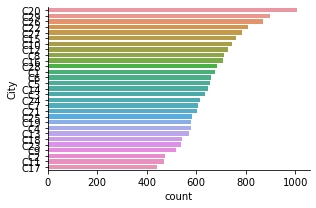

In [34]:
sns.catplot(y='City', kind='count', height=3, aspect=1.5, order = categorical_df1['City'].value_counts().index,data=categorical_df1)

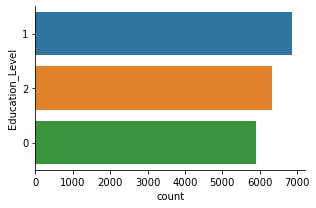

In [35]:
sns.catplot(y='Education_Level', kind='count', height=3, aspect=1.5, order = categorical_df1['Education_Level'].value_counts().index,data=categorical_df1)

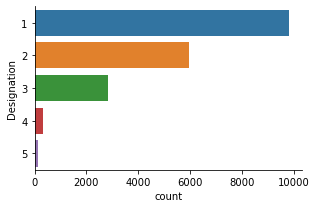

In [36]:
sns.catplot(y='Designation', kind='count', height=3, aspect=1.5, order = categorical_df1['Designation'].value_counts().index,data=categorical_df1)

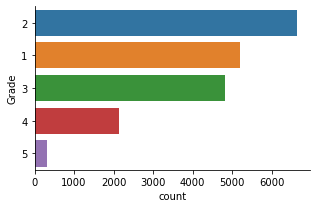

In [37]:
sns.catplot(y='Grade', kind='count', height=3, aspect=1.5, order = categorical_df1['Grade'].value_counts().index,data=categorical_df1)

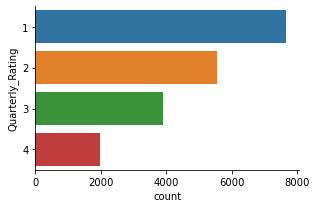

In [38]:
sns.catplot(y='Quarterly_Rating', kind='count', height=3, aspect=1.5, order = categorical_df1['Quarterly_Rating'].value_counts().index,data=categorical_df1)

## Pie Chart

In [39]:
total = categorical_df1['Gender'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

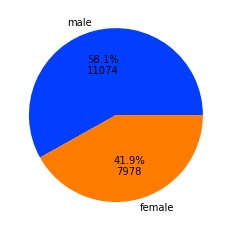

In [40]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['Gender'].value_counts().iloc[:10].values, labels=categorical_df1['Gender'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

In [41]:
categorical_df1.columns

Index(['Reporting_Date', 'Gender', 'City', 'Education_Level', 'Joining_Date',
       'Last_Working_Date', 'Designation', 'Grade', 'Quarterly_Rating'],
      dtype='object')

In [42]:
total = categorical_df1['City'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

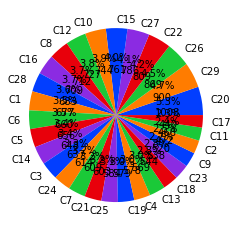

In [43]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['City'].value_counts().iloc[:30].values, labels=categorical_df1['City'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

In [44]:
total = categorical_df1['Education_Level'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

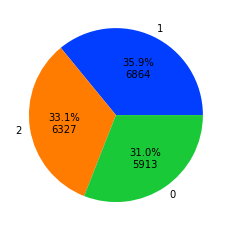

In [45]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['Education_Level'].value_counts().iloc[:10].values, labels=categorical_df1['Education_Level'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

In [46]:
total = categorical_df1['Designation'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

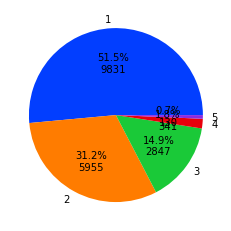

In [47]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['Designation'].value_counts().iloc[:10].values, labels=categorical_df1['Designation'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

In [48]:
total = categorical_df1['Grade'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

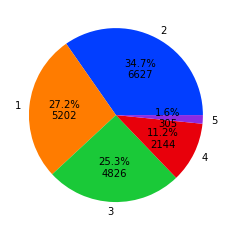

In [49]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['Grade'].value_counts().iloc[:10].values, labels=categorical_df1['Grade'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

In [50]:
total = categorical_df1['Quarterly_Rating'].value_counts().values.sum()
def fmt(x):
    return '{:.1f}%\n{:.0f}'.format(x, total*x/100)

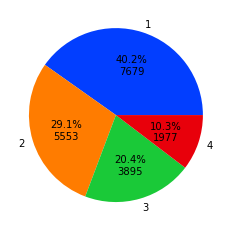

In [51]:
# piechart
colors = sns.color_palette('bright')[0:5]
plt.pie(categorical_df1['Quarterly_Rating'].value_counts().iloc[:10].values, labels=categorical_df1['Quarterly_Rating'].value_counts().index, colors = colors,autopct=fmt)
plt.show()

### For correlation: Heatmaps, Pairplots

In [53]:
numeric_df1.columns

Index(['Driver_ID', 'Age', 'Income', 'Total_Business_value'], dtype='object')

## Heatmap

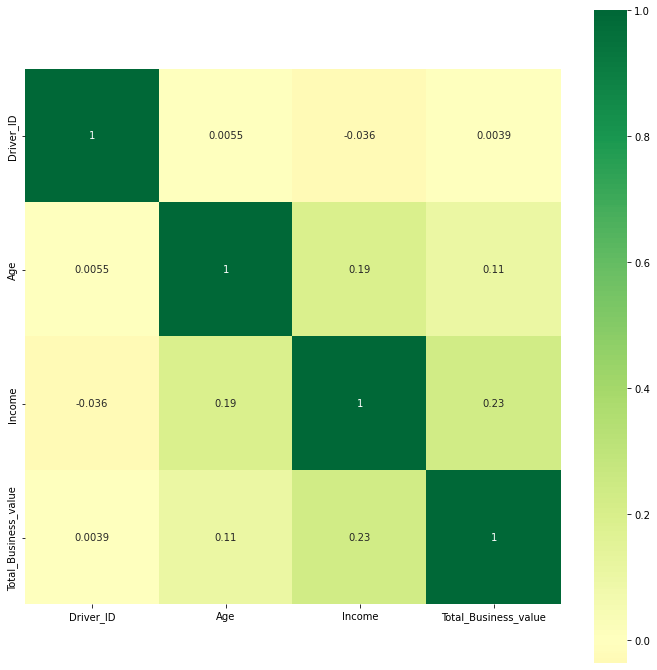

In [54]:
plt.figure(figsize=(12,12))
corr=numeric_df1.corr()
sns.heatmap(corr,square=True,center=0,annot=True,cmap='RdYlGn')

## Pairplot

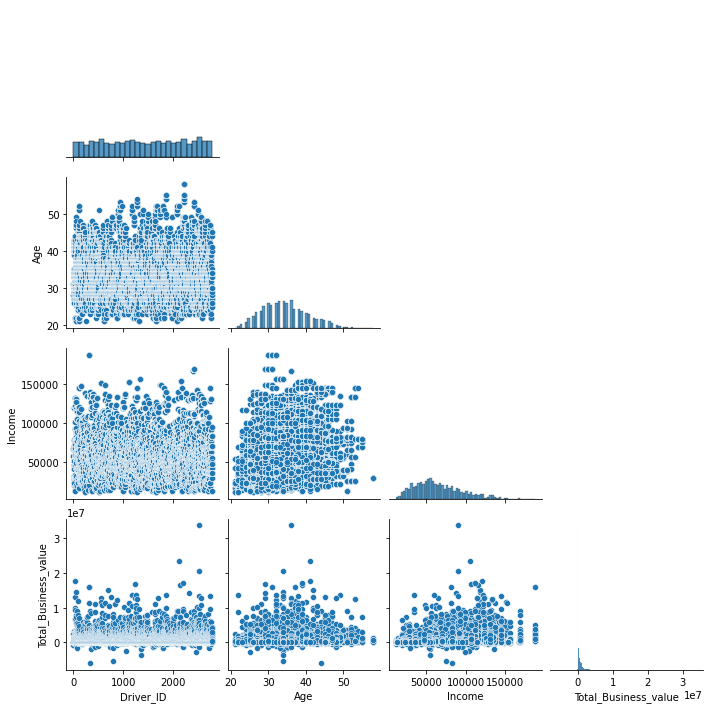

In [55]:
sns.pairplot(numeric_df1,corner=True)

## Data Preprocessing

### Check for missing values and Prepare data for KNN Imputation

In [56]:
df2["MMM-YY"]=pd.to_datetime(df2["MMM-YY"])
df2['Yearofreporting'] = df2['MMM-YY'].dt.year 
df2['Monthofreporting'] = df2['MMM-YY'].dt.month

df2["Dateofjoining"]=pd.to_datetime(df2["Dateofjoining"])
df2['Yearofjoining'] = df2['Dateofjoining'].dt.year 
df2['Monthofjoining'] = df2['Dateofjoining'].dt.month

In [57]:
df2.isnull().sum()

MMM-YY                      0
Driver_ID                   0
Age                        61
Gender                     52
City                        0
Education_Level             0
Income                      0
Dateofjoining               0
LastWorkingDate         17488
Joining Designation         0
Grade                       0
Total Business Value        0
Quarterly Rating            0
Yearofreporting             0
Monthofreporting            0
Yearofjoining               0
Monthofjoining              0
dtype: int64

In [58]:
# Selecting numerical columns
df_nums=df2.select_dtypes(np.number)

In [59]:
df_nums.isnull().sum()

Driver_ID                0
Age                     61
Gender                  52
Education_Level          0
Income                   0
Joining Designation      0
Grade                    0
Total Business Value     0
Quarterly Rating         0
Yearofreporting          0
Monthofreporting         0
Yearofjoining            0
Monthofjoining           0
dtype: int64

In [60]:
df_nums.drop(columns='Driver_ID',inplace=True)
columns=df_nums.columns

In [61]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2, weights='uniform', metric='nan_euclidean',)
imputer.fit(df_nums)
# transform the dataset
df_new = imputer.transform(df_nums)

In [62]:
df_new=pd.DataFrame(df_new)

In [63]:
## Adding the columns names 
df_new.columns=columns

In [64]:
df_new.isnull().sum()

Age                     0
Gender                  0
Education_Level         0
Income                  0
Joining Designation     0
Grade                   0
Total Business Value    0
Quarterly Rating        0
Yearofreporting         0
Monthofreporting        0
Yearofjoining           0
Monthofjoining          0
dtype: int64

In [65]:
rem_columns=list(set(df.columns).difference(set(columns)))
rem_columns

['LastWorkingDate', 'City', 'Driver_ID', 'Dateofjoining', 'MMM-YY']

In [66]:
data=pd.concat([df[rem_columns],df_new],axis=1)

In [67]:
data.head()

,LastWorkingDate,City,Driver_ID,Dateofjoining,MMM-YY,Age,Gender,Education_Level,Income,Joining Designation,Grade,Total Business Value,Quarterly Rating,Yearofreporting,Monthofreporting,Yearofjoining,Monthofjoining
0,NaN,C23,1,24-12-2018,01-01-2019,28.0,0.0,2.0,57387.0,1.0,1.0,2381060.0,2.0,2019.0,1.0,2018.0,12.0
1,NaN,C23,1,24-12-2018,02-01-2019,28.0,0.0,2.0,57387.0,1.0,1.0,-665480.0,2.0,2019.0,2.0,2018.0,12.0
2,03-11-2019,C23,1,24-12-2018,03-01-2019,28.0,0.0,2.0,57387.0,1.0,1.0,0.0,2.0,2019.0,3.0,2018.0,12.0
3,NaN,C7,2,11-06-2020,11-01-2020,31.0,0.0,2.0,67016.0,2.0,2.0,0.0,1.0,2020.0,11.0,2020.0,11.0
4,NaN,C7,2,11-06-2020,12-01-2020,31.0,0.0,2.0,67016.0,2.0,2.0,0.0,1.0,2020.0,12.0,2020.0,11.0


### Aggregate data in order to remove multiple occurrences of same driver data

In [68]:
agg_dict = {'Age':'max', 'Gender':'first','City':'first',
 'Education_Level':'last', 'Income':'last',
 'Joining Designation':'last','Grade':'last',
 'Dateofjoining':'last','LastWorkingDate':'last',
 'Total Business Value':'sum','Quarterly Rating':'last',
 "Yearofreporting":"last","Monthofreporting":"last" ,"Yearofjoining": "first","Monthofjoining":"first"}

In [69]:
data_agg=data.groupby(['Driver_ID','MMM-YY']).aggregate(agg_dict)

In [70]:
data_agg

Age  Gender City  Education_Level    Income  \
Driver_ID MMM-YY                                                     
1         01-01-2019  28.0     0.0  C23              2.0   57387.0   
          02-01-2019  28.0     0.0  C23              2.0   57387.0   
          03-01-2019  28.0     0.0  C23              2.0   57387.0   
2         11-01-2020  31.0     0.0   C7              2.0   67016.0   
          12-01-2020  31.0     0.0   C7              2.0   67016.0   
4         01-01-2020  43.0     0.0  C13              2.0   65603.0   
          02-01-2020  43.0     0.0  C13              2.0   65603.0   
          03-01-2020  43.0     0.0  C13              2.0   65603.0   
          04-01-2020  43.0     0.0  C13              2.0   65603.0   
          12-01-2019  43.0     0.0  C13              2.0   65603.0   
5         01-01-2019  29.0     0.0   C9              0.0   46368.0   
          02-01-2019  29.0     0.0   C9              0.0   46368.0   
          03-01-2019  29.0     0.0   C9              0.0   46368.0   
6         08-01-2020  31.0     1.0  C11              1.0   78728.0   
          09-01-2020  31.0     1.0  C11              1.0   78728.0   
          10-01-2020  31.0     1.0  C11              1.0   78728.0   
          11-01-2020  31.0     1.0  C11              1.0   78728.0   
          12-01-2020  31.0     1.0  C11              1.0   78728.0   
8         09-01-2020  34.0     0.0   C2              0.0   70656.0   
          10-01-2020  34.0     0.0   C2              0.0   70656.0   
          11-01-2020  34.0     0.0   C2              0.0   70656.0   
11        12-01-2020  28.0     1.0  C19              2.0   42172.0   
12        07-01-2019  35.0     0.0  C23              2.0   28116.0   
          08-01-2019  35.0     0.0  C23              2.0   28116.0   
          09-01-2019  35.0     0.0  C23              2.0   28116.0   
          10-01-2019  35.0     0.0  C23              2.0   28116.0   
          11-01-2019  35.0     0.0  C23              2.0   28116.0   
          12-01-2019  35.0     0.0  C23              2.0   28116.0   
13        01-01-2019  29.0     0.0  C19              2.0  119227.0   
          01-01-2020  30.0     0.0  C19              2.0  119227.0   
          02-01-2019  29.0     0.0  C19              2.0  119227.0   
          02-01-2020  30.0     0.0  C19              2.0  119227.0   
          03-01-2019  29.0     0.0  C19              2.0  119227.0   
          03-01-2020  30.0     0.0  C19              2.0  119227.0   
          04-01-2019  29.0     0.0  C19              2.0  119227.0   
          04-01-2020  30.0     0.0  C19              2.0  119227.0   
          05-01-2019  29.0     0.0  C19              2.0  119227.0   
          05-01-2020  30.0     0.0  C19              2.0  119227.0   
          06-01-2019  29.0     0.0  C19              2.0  119227.0   
          06-01-2020  30.0     0.0  C19              2.0  119227.0   
          07-01-2019  29.0     0.0  C19              2.0  119227.0   
          07-01-2020  30.0     0.0  C19              2.0  119227.0   
          08-01-2019  29.0     0.0  C19              2.0  119227.0   
          08-01-2020  30.0     0.0  C19              2.0  119227.0   
          09-01-2019  29.0     0.0  C19              2.0  119227.0   
          09-01-2020  30.0     0.0  C19              2.0  119227.0   
          10-01-2019  29.0     0.0  C19              2.0  119227.0   
          10-01-2020  30.0     0.0  C19              2.0  119227.0   
          11-01-2019  30.0     0.0  C19              2.0  119227.0   
          11-01-2020  31.0     0.0  C19              2.0  119227.0   
          12-01-2019  30.0     0.0  C19              2.0  119227.0   
14        10-01-2020  39.0     1.0  C26              0.0   19734.0   
          11-01-2020  39.0     1.0  C26              0.0   19734.0   
          12-01-2020  39.0     1.0  C26              0.0   19734.0   
16        01-01-2019  30.0     1.0  C23              0.0   52963.0   
          02-01-2019  30.0     1.

In [71]:
## We notice that the reporting date (MMM-YY) needs to be sorted.

In [72]:
data_sort=data_agg.sort_values(by=["Driver_ID",'MMM-YY'], ascending=True).reset_index()

In [73]:
data_sort.head()

,Driver_ID,MMM-YY,Age,Gender,City,Education_Level,Income,Joining Designation,Grade,Dateofjoining,LastWorkingDate,Total Business Value,Quarterly Rating,Yearofreporting,Monthofreporting,Yearofjoining,Monthofjoining
0,1,01-01-2019,28.0,0.0,C23,2.0,57387.0,1.0,1.0,24-12-2018,None,2381060.0,2.0,2019.0,1.0,2018.0,12.0
1,1,02-01-2019,28.0,0.0,C23,2.0,57387.0,1.0,1.0,24-12-2018,None,-665480.0,2.0,2019.0,2.0,2018.0,12.0
2,1,03-01-2019,28.0,0.0,C23,2.0,57387.0,1.0,1.0,24-12-2018,03-11-2019,0.0,2.0,2019.0,3.0,2018.0,12.0
3,2,11-01-2020,31.0,0.0,C7,2.0,67016.0,2.0,2.0,11-06-2020,None,0.0,1.0,2020.0,11.0,2020.0,11.0
4,2,12-01-2020,31.0,0.0,C7,2.0,67016.0,2.0,2.0,11-06-2020,None,0.0,1.0,2020.0,12.0,2020.0,11.0


### Driver Level Aggregation

In [74]:
### Aggregate data in order to remove multiple occurrences of same driver data 

In [75]:
## create a new dataframe for the driver level aggregation 

In [76]:
df_1=pd.DataFrame()
# adding the unique driver IDs to this new DF.
df_1["Driver_ID"]=data_sort["Driver_ID"].unique()

In [77]:
df_1.head()

,Driver_ID
0,1
1,2
2,4
3,5
4,6


In [78]:
# aggregating various feature values and creating a list that is assigned to the driver IDs in the new dataframe df_1

df_1['Age'] = list(df2.groupby('Driver_ID',axis=0).max('MMM-YY')['Age'])
df_1['Gender'] = list(df2.groupby('Driver_ID').agg({'Gender':'last'})['Gender'])
df_1['City'] = list(df2.groupby('Driver_ID').agg({'City':'last'})['City'])
df_1['Education_Level'] = list(df2.groupby('Driver_ID').agg({'Education_Level':'last'})['Education_Level'])
df_1['Income'] = list(df2.groupby('Driver_ID').agg({'Income':'last'})['Income'])
df_1['Joining_Designation'] = list(df2.groupby('Driver_ID').agg({'Joining Designation':'last'})["Joining Designation"])
df_1['Grade'] = list(df2.groupby('Driver_ID').agg({'Grade':'last'})['Grade'])
df_1["Total Business Value"] = list(df2.groupby('Driver_ID',axis=0).sum("Total Business Value")["Total Business Value"])
df_1['Last_Quarterly_Rating'] = list(df2.groupby('Driver_ID').agg({'Quarterly Rating':"last"})["Quarterly Rating"])
df_1['Monthofjoining'] = list(df2.groupby('Driver_ID').agg({'Monthofjoining':"first"})["Monthofjoining"])
df_1['Yearofjoining'] = list(df2.groupby('Driver_ID').agg({'Yearofjoining':"first"})["Yearofjoining"])
df_1['Yearofreporting'] = list(df2.groupby('Driver_ID').agg({'Yearofreporting':"last"})["Yearofreporting"])
df_1['Monthofreporting'] = list(df2.groupby('Driver_ID').agg({'Monthofreporting':"last"})["Monthofreporting"])

## Feature Engineering

In [79]:
#Quarterly rating at the beginning
qrf = df2.groupby('Driver_ID').agg({'Quarterly Rating':'first'})

#Quarterly rating at the end
qrl = df2.groupby('Driver_ID').agg({'Quarterly Rating':'last'})

# We create a DF which has the driver IDs and a boolean value which tells if the rating has increased or not.
qr = (qrl['Quarterly Rating']>qrf['Quarterly Rating']).reset_index()

In [80]:
#the driver ids whose rating has increased

dr_id = qr[qr['Quarterly Rating']==True]['Driver_ID']

In [81]:
rating_flag = []  # defining an empty list of flags 

for i in df_1['Driver_ID']:
    if i in dr_id.values: 
        rating_flag.append(1)
    else:
        rating_flag.append(0)

In [82]:
df_1['Q_Rating_Inc_Flag'] = rating_flag

In [83]:
#Income at the beginning
income_first = df2.groupby('Driver_ID').agg({'Income':'first'})

# Income at the end

income_last = df2.groupby('Driver_ID').agg({'Income':'last'})

#The dataset which has the employee ids and a bollean value which tells if the month

income_diff = (income_last['Income']>income_first['Income']).reset_index()

#the employee ids whose monthly income has increased
dr_id = income_diff[income_diff['Income']==True]['Driver_ID']

In [84]:
inc = []
for i in df_1['Driver_ID']:
    if i in dr_id.values:
        inc.append(1)
    else:
        inc.append(0)
df_1['Income_Inc_Flag'] = inc

In [85]:
lwr = (data_sort.groupby('Driver_ID').agg({'LastWorkingDate':'last'})['LastWorkingDate'].isnull().reset_index())
#The employee ids who do not have last working date
empid = lwr[lwr['LastWorkingDate']==True]['Driver_ID']
target = []
for i in df_1['Driver_ID']:
    if i in empid.values:
        target.append(0)
    elif i not in empid.values:
        target.append(1)

df_1['Target'] = target

In [86]:
df_1["Target"].value_counts()

1    1616
0     765
Name: Target, dtype: int64

In [87]:
final_df = df_1

In [88]:
final_df.head()

,Driver_ID,Age,Gender,City,Education_Level,Income,Joining_Designation,Grade,Total Business Value,Last_Quarterly_Rating,Monthofjoining,Yearofjoining,Yearofreporting,Monthofreporting,Q_Rating_Inc_Flag,Income_Inc_Flag,Target
0,1,28.0,0.0,C23,2,57387,1,1,1715580,2,12,2018,2019,3,0,0,1
1,2,31.0,0.0,C7,2,67016,2,2,0,1,11,2020,2020,12,0,0,0
2,4,43.0,0.0,C13,2,65603,2,2,350000,1,12,2019,2020,4,0,0,1
3,5,29.0,0.0,C9,0,46368,1,1,120360,1,1,2019,2019,3,0,0,1
4,6,31.0,1.0,C11,1,78728,3,3,1265000,2,7,2020,2020,12,1,0,0


## Statistical summary of the derived dataset

In [89]:
final_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Driver_ID,2381.0,NaN,NaN,NaN,1397.559009,806.161628,1.0,695.0,1400.0,2100.0,2788.0
Age,2381.0,NaN,NaN,NaN,33.663167,5.983375,21.0,29.0,33.0,37.0,58.0
Gender,2381.0,NaN,NaN,NaN,0.410332,0.491997,0.0,0.0,0.0,1.0,1.0
City,2381,29,C20,152,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education_Level,2381.0,NaN,NaN,NaN,1.00756,0.81629,0.0,0.0,1.0,2.0,2.0
Income,2381.0,NaN,NaN,NaN,59334.157077,28383.666384,10747.0,39104.0,55315.0,75986.0,188418.0
Joining_Designation,2381.0,NaN,NaN,NaN,1.820244,0.841433,1.0,1.0,2.0,2.0,5.0
Grade,2381.0,NaN,NaN,NaN,2.096598,0.941522,1.0,1.0,2.0,3.0,5.0
Total Business Value,2381.0,NaN,NaN,NaN,4586741.822764,9127115.313446,-1385530.0,0.0,817680.0,4173650.0,95331060.0
Last_Quarterly_Rating,2381.0,NaN,NaN,NaN,1.427971,0.809839,1.0,1.0,1.0,2.0,4.0


In [90]:
# Target varibale
final_df['Target'].value_counts(normalize=True)*100

1    67.870643
0    32.129357
Name: Target, dtype: float64

Approx 68% of the driver population has left the company.

### Check correlation among independent variables and how they interact with each other

Age - Target relationship

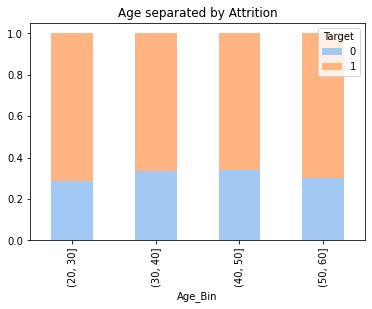

In [91]:
#Binning the Age into categories
final_df['Age_Bin'] = pd.cut(final_df['Age'],bins=[20,30,40,50,60])

#Age feature with Target
agebin = pd.crosstab(final_df['Age_Bin'],final_df['Target'])
agebin.div(agebin.sum(1).astype(float),axis=0).plot(kind='bar',stacked=True,title="Age separated by Attrition",color=sns.color_palette("pastel"))

<Figure size 2160x504 with 0 Axes>

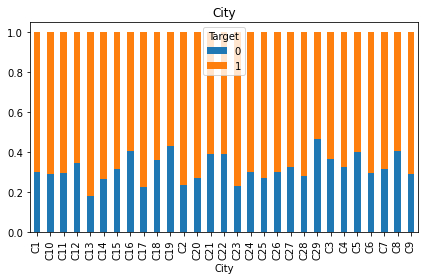

In [92]:
#City feature with the target
plt.figure(figsize=(30,7))
city = pd.crosstab(final_df['City'],final_df['Target'])
city.div(city.sum(1).astype(float),axis=0).plot(kind='bar',stacked=True,title="City")
plt.tight_layout()

Income-Churn relationship

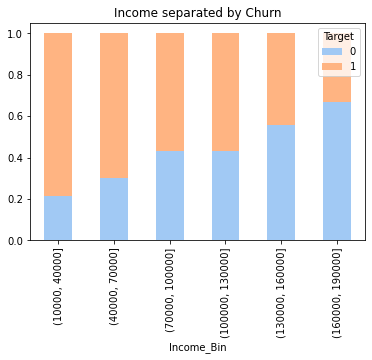

In [93]:
#Binning the Income into categories
final_df['Income_Bin'] = pd.cut(final_df['Income'],bins=[10000, 40000, 70000, 100000, 130000,160000,190000])

salarybin = pd.crosstab(final_df['Income_Bin'],final_df['Target'])
salarybin.div(salarybin.sum(1).astype(float),axis=0).plot(kind='bar',stacked=True,title="Income separated by Churn",color=sns.color_palette("pastel"))

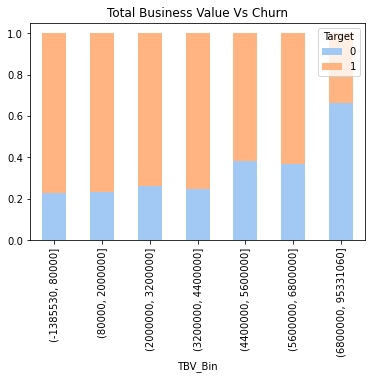

In [94]:
m1 = round(final_df['Total Business Value'].min())
m2 = round(final_df['Total Business Value'].max())
bins = [m1, 80000 , 2000000 , 3200000, 4400000, 5600000, 6800000, m2]
#Binning the Total Business Value into categories
final_df['TBV_Bin'] = pd.cut(final_df['Total Business Value'],bins)
#Total Business Value feature with Target
tbvbin = pd.crosstab(final_df['TBV_Bin'],final_df['Target'])
tbvbin.div(tbvbin.sum(1).astype(float),axis=0).plot(kind='bar',stacked=True,title="Total Business Value Vs Churn",color=sns.color_palette("pastel"))

In [95]:
final_df.drop(["Age_Bin","Income_Bin","TBV_Bin"],axis=1, inplace=True)

In [96]:
final_df.drop(["Driver_ID","Last_Quarterly_Rating"],axis=1,inplace=True)

Correlation check

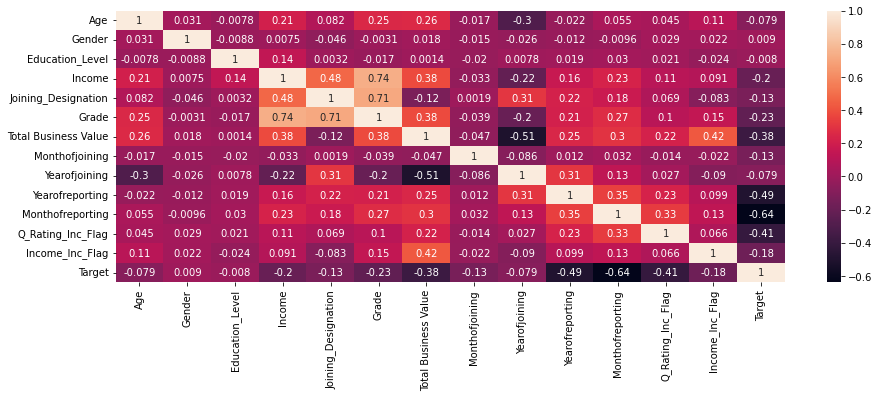

In [97]:
# Plotting Heat Map to Check for Correlation
plt.figure(figsize=(15,5))
sns.heatmap(final_df.corr(), annot=True) 
plt.show()

In [98]:
final_df.drop(["Yearofreporting","Monthofjoining"],axis=1,inplace=True)

In [99]:
final_df.shape

(2381, 13)

## Outlier treatment

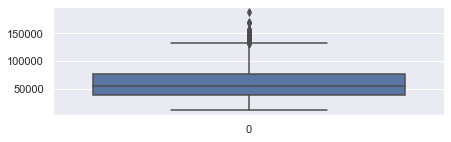

In [100]:
sns.set(rc={'figure.figsize':(7,2)})
sns.boxplot(final_df.Income)

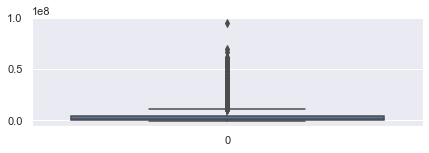

In [101]:
sns.boxplot(final_df['Total Business Value'])

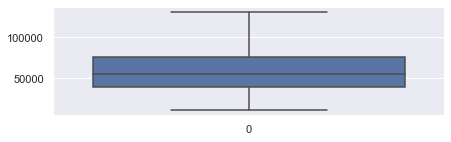

In [102]:
q1 = np.percentile(final_df.Income, 25)
q3 = np.percentile(final_df.Income, 75)
IQR = q3-q1
lwr_bound = q1-(1.5*IQR)
upr_bound = q3+(1.5*IQR)
final_df.Income = np.where(final_df.Income < lwr_bound, lwr_bound, final_df.Income)
final_df.Income = np.where(final_df.Income > upr_bound, upr_bound, final_df.Income)
sns.boxplot(final_df.Income)

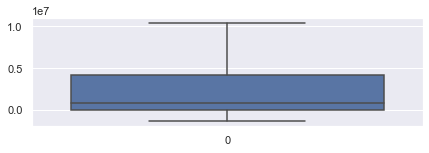

In [103]:
q1 = np.percentile(final_df['Total Business Value'], 25)
q3 = np.percentile(final_df['Total Business Value'], 75)
IQR = q3-q1
lwr_bound = q1-(1.5*IQR)
upr_bound = q3+(1.5*IQR)
final_df['Total Business Value'] = np.where(final_df['Total Business Value'] < lwr_bound, lwr_bound, final_df['Total Business Value'])
final_df['Total Business Value'] = np.where(final_df['Total Business Value'] > upr_bound, upr_bound, final_df['Total Business Value'])
sns.boxplot(final_df['Total Business Value'])

### Data preprocessing before Model building

In [104]:
X=final_df.drop(["Target"], axis=1)
X.shape

(2381, 12)

In [105]:
Y=final_df["Target"]
Y.shape

(2381,)

In [106]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2381 entries, 0 to 2380
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   2381 non-null   float64
 1   Gender                2381 non-null   float64
 2   City                  2381 non-null   object 
 3   Education_Level       2381 non-null   int64  
 4   Income                2381 non-null   float64
 5   Joining_Designation   2381 non-null   int64  
 6   Grade                 2381 non-null   int64  
 7   Total Business Value  2381 non-null   float64
 8   Yearofjoining         2381 non-null   int64  
 9   Monthofreporting      2381 non-null   int64  
 10  Q_Rating_Inc_Flag     2381 non-null   int64  
 11  Income_Inc_Flag       2381 non-null   int64  
dtypes: float64(4), int64(7), object(1)
memory usage: 223.3+ KB


### One hot encoding of the categorical variable

In [107]:
#X = pd.get_dummies(X,prefix=[''],columns=['City'])

In [108]:
!pip install category-encoders

In [109]:
X.shape

(2381, 12)

In [110]:
## Train_test_split
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=42)

In [111]:
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((1904, 12), (477, 12), (1904,), (477,))

In [112]:
Y_train.value_counts(normalize=True)

1    0.676996
0    0.323004
Name: Target, dtype: float64

In [113]:
cat_cols=["City"]
from category_encoders import TargetEncoder
enc= TargetEncoder(cols=cat_cols).fit(X_train,Y_train)
X_train= enc.transform(X_train)
print(X_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1904 entries, 457 to 860
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   1904 non-null   float64
 1   Gender                1904 non-null   float64
 2   City                  1904 non-null   float64
 3   Education_Level       1904 non-null   int64  
 4   Income                1904 non-null   float64
 5   Joining_Designation   1904 non-null   int64  
 6   Grade                 1904 non-null   int64  
 7   Total Business Value  1904 non-null   float64
 8   Yearofjoining         1904 non-null   int64  
 9   Monthofreporting      1904 non-null   int64  
 10  Q_Rating_Inc_Flag     1904 non-null   int64  
 11  Income_Inc_Flag       1904 non-null   int64  
dtypes: float64(5), int64(7)
memory usage: 193.4 KB
None


In [114]:
#### Target encoding of the test data
X_test= enc.transform(X_test,Y_test)

In [115]:
X_train.head()

,Age,Gender,City,Education_Level,Income,Joining_Designation,Grade,Total Business Value,Yearofjoining,Monthofreporting,Q_Rating_Inc_Flag,Income_Inc_Flag
457,28.0,0.0,0.745108,0,87872.0,3,3,0.0,2020,12,0,0
1739,34.0,0.0,0.699186,0,38619.0,2,2,466160.0,2019,3,0,0
1848,27.0,0.0,0.732320,0,53105.0,1,2,0.0,2017,2,0,0
1410,30.0,1.0,0.611473,2,34234.0,1,1,3489080.0,2019,12,1,0
829,47.0,0.0,0.611473,0,90484.0,1,3,10434125.0,2015,12,0,0


Class Imbalance Treatment

SMOTE

In [116]:
from imblearn.over_sampling import SMOTE

sm = SMOTE()
X_sm, y_sm = sm.fit_resample(X_train, Y_train)

In [117]:
X_sm.shape

(2578, 12)

In [118]:
y_sm.value_counts()

0    1289
1    1289
Name: Target, dtype: int64

### Standardization of training data

In [119]:
X_train.head()

,Age,Gender,City,Education_Level,Income,Joining_Designation,Grade,Total Business Value,Yearofjoining,Monthofreporting,Q_Rating_Inc_Flag,Income_Inc_Flag
457,28.0,0.0,0.745108,0,87872.0,3,3,0.0,2020,12,0,0
1739,34.0,0.0,0.699186,0,38619.0,2,2,466160.0,2019,3,0,0
1848,27.0,0.0,0.732320,0,53105.0,1,2,0.0,2017,2,0,0
1410,30.0,1.0,0.611473,2,34234.0,1,1,3489080.0,2019,12,1,0
829,47.0,0.0,0.611473,0,90484.0,1,3,10434125.0,2015,12,0,0


In [120]:
from sklearn.preprocessing import StandardScaler
# Select the features to scale
features_to_scale = ['Age', 'Education_Level', 'Income', 'Joining_Designation',
                     'Total Business Value', 'Yearofjoining', 'Monthofreporting']

# Create a StandardScaler
scaler = StandardScaler()

# Scale the selected features
X_train[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])

In [121]:
X_test[features_to_scale] = scaler.transform(X_test[features_to_scale])

### Model Building - BaggingClassifier model

In [122]:
from sklearn.ensemble import BaggingClassifier

model = BaggingClassifier()
model.fit(X_train, Y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [123]:
from sklearn.metrics import accuracy_score

# Calculate accuracy on the training dataset
train_accuracy = accuracy_score(Y_train, y_train_pred)

# Calculate accuracy on the testing dataset
test_accuracy = accuracy_score(Y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.2f}")
print(f"Testing Accuracy: {test_accuracy:.2f}")

Training Accuracy: 0.99
Testing Accuracy: 0.95


### Hyper parameter tuning

In [124]:
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from scipy.stats import randint

# Define the BaggingClassifier
base_estimator = DecisionTreeClassifier()
bagging_model = BaggingClassifier(base_estimator=base_estimator)

# Define the hyperparameter distribution
param_dist = {
    'n_estimators': randint(10, 200),           # Number of base estimators
    'max_samples': [0.5, 0.7, 0.8, 1.0],       # Fraction of samples used for training each base estimator
    'max_features': [0.5, 0.7, 0.8, 1.0],      # Fraction of features used for training each base estimator
    'base_estimator__max_depth': [2,3,5,6,7,9,10,12,13,15],  # Max depth of the base DecisionTreeClassifier
    'base_estimator__min_samples_split': randint(2, 11),  # Min samples required to split an internal node
    # Add more hyperparameters as needed
}

# Create the RandomizedSearchCV object with cross-validation
random_search = RandomizedSearchCV(estimator=bagging_model, param_distributions=param_dist, n_iter=100, cv=5, scoring='accuracy', random_state=42)

# Fit the model to the data
random_search.fit(X_train, Y_train)

# Print the best hyperparameters and corresponding accuracy
best_params = random_search.best_params_
best_accuracy = random_search.best_score_

print("Best Hyperparameters:")
print(best_params)
print(f"Best Cross-Validation Accuracy: {best_accuracy:.2f}")

Best Hyperparameters:
{'base_estimator__max_depth': 9, 'base_estimator__min_samples_split': 7, 'max_features': 0.7, 'max_samples': 1.0, 'n_estimators': 63}
Best Cross-Validation Accuracy: 0.95


In [125]:
# Define the base estimator with the specified hyperparameters
base_estimator = DecisionTreeClassifier(max_depth=10, min_samples_split=10)

# Create the BaggingClassifier with the specified hyperparameters
bag_model = BaggingClassifier(
    base_estimator=base_estimator,
    n_estimators=171,
    max_samples=1.0,
    max_features=1.0,
    bootstrap=True,
    random_state=42  # You can set a random state for reproducibility
)

# Fit the model to the training data
bag_model.fit(X_train, Y_train)

# Predict on the training and test data
y_train_pred = bag_model.predict(X_train)
y_test_pred = bag_model.predict(X_test)

In [126]:
## Checking accuracy after hyper parameter tuning

In [127]:
# Calculate accuracy on the training dataset
train_accuracy_bag = accuracy_score(Y_train, y_train_pred)

# Calculate accuracy on the testing dataset
test_accuracy_bag = accuracy_score(Y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy_bag:.2f}")
print(f"Testing Accuracy: {test_accuracy_bag:.2f}")

Training Accuracy: 0.96
Testing Accuracy: 0.95


Plotting confusion_matrix for train and test data

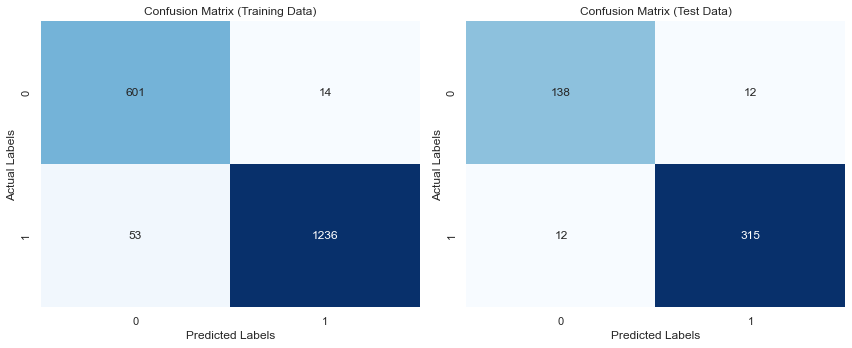

In [128]:
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix for the training data
train_confusion_matrix = confusion_matrix(Y_train, y_train_pred)

# Calculate the confusion matrix for the test data
test_confusion_matrix = confusion_matrix(Y_test, y_test_pred)

# Plot the confusion matrix for the training data
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_confusion_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix (Training Data)')

# Plot the confusion matrix for the test data
plt.subplot(1, 2, 2)
sns.heatmap(test_confusion_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix (Test Data)')

plt.tight_layout()
plt.show()


In [129]:
### Classification report

In [130]:
from sklearn.metrics import classification_report

# Calculate classification metrics for the training data
train_classification_report = classification_report(Y_train, y_train_pred)

# Calculate classification metrics for the test data
test_classification_report = classification_report(Y_test, y_test_pred)

# Print classification metrics for the training data
print("Classification Report for Training Data:\n", train_classification_report)

# Print classification metrics for the test data
print("\nClassification Report for Test Data:\n", test_classification_report)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95       615
           1       0.99      0.96      0.97      1289

    accuracy                           0.96      1904
   macro avg       0.95      0.97      0.96      1904
weighted avg       0.97      0.96      0.97      1904


Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       150
           1       0.96      0.96      0.96       327

    accuracy                           0.95       477
   macro avg       0.94      0.94      0.94       477
weighted avg       0.95      0.95      0.95       477



In [131]:
## ROC AUC curve

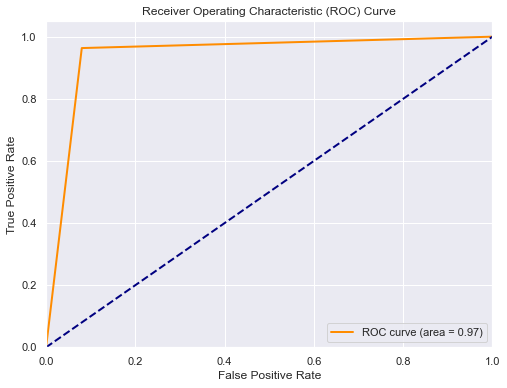

In [132]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate the ROC curve for the test data
fpr, tpr, thresholds = roc_curve(Y_test, y_test_pred)

# Calculate the AUC (Area Under the Curve) score
roc_auc = roc_auc_score(Y_train, y_train_pred)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Text(0.5, 1.0, 'Feature Importance ')

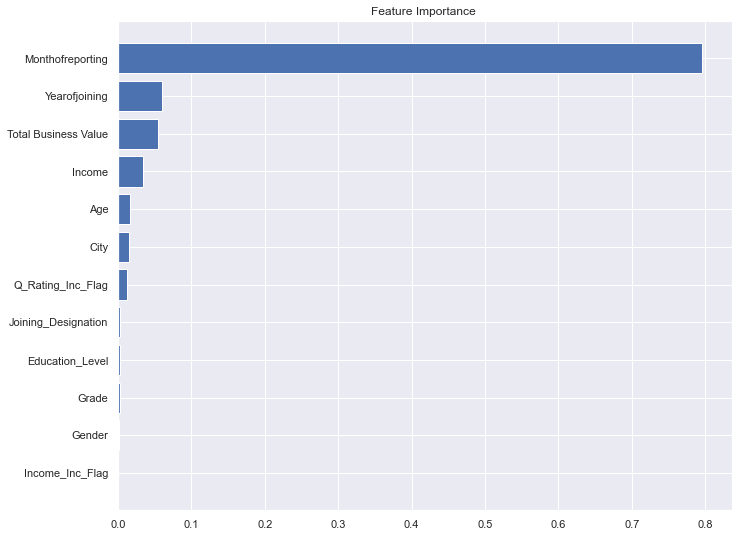

In [134]:
feature_importances_bagging = np.mean([tree.feature_importances_ for tree in bag_model.estimators_], axis=0)

sorted_idx = np.argsort(feature_importances_bagging)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(11, 9))

plt.barh(pos, feature_importances_bagging[sorted_idx], align="center")
plt.yticks(pos, np.array(X_train.columns)[sorted_idx])
plt.title("Feature Importance ")

## Boosting model

In [135]:
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier as GBC
from xgboost.sklearn import XGBClassifier

In [136]:
GB_model = GBC(n_estimators=200, learning_rate=0.23, max_depth=4, random_state=0, verbose = 1)
GB_model.fit(X_train, Y_train)

      Iter       Train Loss   Remaining Time 
         1           0.9305            1.19s
         2           0.7385            0.89s
         3           0.6125            0.92s
         4           0.5226            0.88s
         5           0.4609            0.86s
         6           0.4089            0.81s
         7           0.3716            0.77s
         8           0.3434            0.77s
         9           0.3192            0.78s
        10           0.3012            0.77s
        20           0.2135            0.62s
        30           0.1729            0.58s
        40           0.1391            0.53s
        50           0.1152            0.49s
        60           0.0942            0.46s
        70           0.0802            0.43s
        80           0.0692            0.39s
        90           0.0578            0.36s
       100           0.0500            0.32s
       200           0.0123            0.00s


GradientBoostingClassifier(learning_rate=0.23, max_depth=4, n_estimators=200,
                           random_state=0, verbose=1)

In [137]:
# Make predictions on the training and test data
y_train_pred = GB_model.predict(X_train)
y_test_pred = GB_model.predict(X_test)

In [138]:
# Calculate accuracy on the training dataset
train_accuracy = accuracy_score(Y_train, y_train_pred)

# Calculate accuracy on the testing dataset
test_accuracy = accuracy_score(Y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.2f}")
print(f"Testing Accuracy: {test_accuracy:.2f}")

Training Accuracy: 1.00
Testing Accuracy: 0.94


In [139]:
XGB_model=xgb.XGBClassifier(random_state=1,learning_rate=0.01)
XGB_model.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [140]:
# Make predictions on the training and test data
y_train_pred = XGB_model.predict(X_train)
y_test_pred = XGB_model.predict(X_test)

In [141]:
# Calculate accuracy on the training dataset
train_accuracy = accuracy_score(Y_train, y_train_pred)

# Calculate accuracy on the testing dataset
test_accuracy = accuracy_score(Y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.2f}")
print(f"Testing Accuracy: {test_accuracy:.2f}")

Training Accuracy: 0.96
Testing Accuracy: 0.94


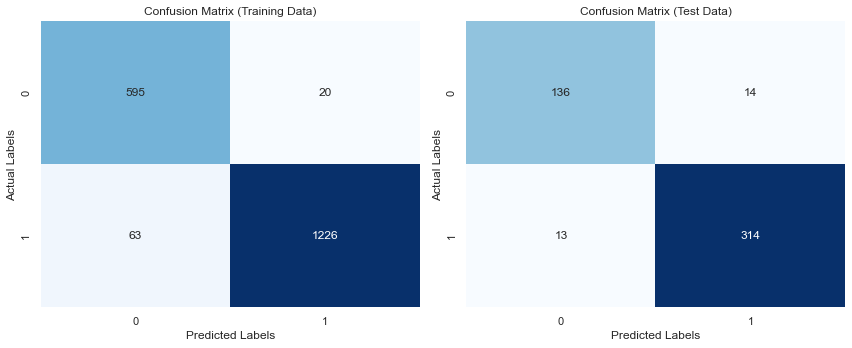

In [142]:
train_confusion_matrix = confusion_matrix(Y_train, y_train_pred)

# Calculate the confusion matrix for the test data
test_confusion_matrix = confusion_matrix(Y_test, y_test_pred)

# Plot the confusion matrix for the training data
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.heatmap(train_confusion_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix (Training Data)')

# Plot the confusion matrix for the test data
plt.subplot(1, 2, 2)
sns.heatmap(test_confusion_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix (Test Data)')

plt.tight_layout()
plt.show()

In [143]:
from sklearn.metrics import classification_report

# Calculate classification metrics for the training data
train_classification_report = classification_report(Y_train, y_train_pred)

# Calculate classification metrics for the test data
test_classification_report = classification_report(Y_test, y_test_pred)

# Print classification metrics for the training data
print("Classification Report for Training Data:\n", train_classification_report)

# Print classification metrics for the test data
print("\nClassification Report for Test Data:\n", test_classification_report)

Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.90      0.97      0.93       615
           1       0.98      0.95      0.97      1289

    accuracy                           0.96      1904
   macro avg       0.94      0.96      0.95      1904
weighted avg       0.96      0.96      0.96      1904


Classification Report for Test Data:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91       150
           1       0.96      0.96      0.96       327

    accuracy                           0.94       477
   macro avg       0.94      0.93      0.93       477
weighted avg       0.94      0.94      0.94       477



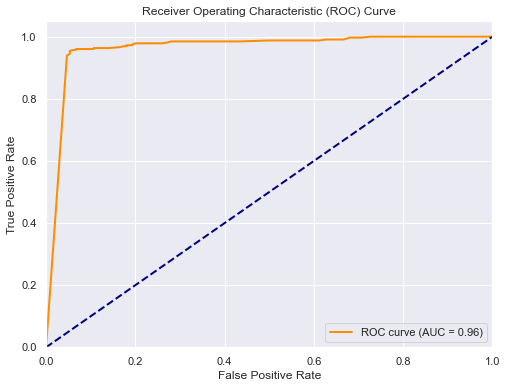

In [144]:
from sklearn.metrics import roc_curve, roc_auc_score
# Get the predicted probabilities for the positive class (class 1)
y_val_probabilities = XGB_model.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(Y_test, y_val_probabilities)

# Calculate the AUC (Area Under the ROC Curve)
roc_auc = roc_auc_score(Y_test, y_val_probabilities)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Text(0.5, 1.0, 'Feature Importance')

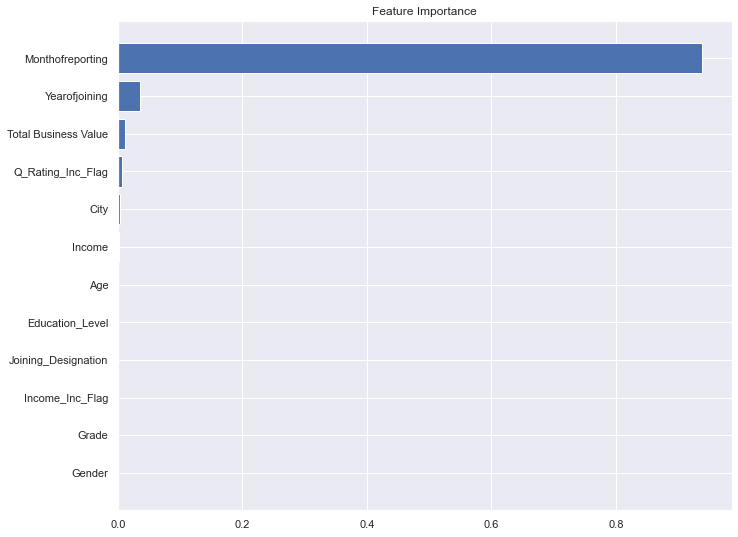

In [145]:
feature_importance = XGB_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(11, 9))

plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(X_train.columns)[sorted_idx])
plt.title("Feature Importance")

In [146]:
#Boosting model performs better than Bagging classifer

In [147]:
#!pip install scikit-learn==0.23.1

In [148]:
from imblearn.over_sampling import SMOTE

In [149]:
sm = SMOTE()
X_sm, y_sm = sm.fit_resample(X_train, Y_train)

In [150]:
y_sm.value_counts()

0    1289
1    1289
Name: Target, dtype: int64

In [151]:
XGB_model_1=xgb.XGBClassifier(random_state=1,learning_rate=0.01)
XGB_model_1.fit(X_sm, y_sm)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [152]:
# Make predictions on the training and test data
y_train_pred = XGB_model_1.predict(X_sm)
#y_test_pred = XGB_model_1.predict(X_test)

In [153]:
# Calculate accuracy on the training dataset
train_accuracy = accuracy_score(y_sm, y_train_pred)

# Calculate accuracy on the testing dataset
#test_accuracy = accuracy_score(Y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.2f}")
#print(f"Testing Accuracy: {test_accuracy:.2f}")

Training Accuracy: 0.96


In [158]:
from sklearn.metrics import classification_report

# Calculate classification metrics for the training data
train_classification_report = classification_report(y_sm, y_train_pred)
# Print classification metrics for the training data
print("Classification Report for Training Data:\n", train_classification_report)


Classification Report for Training Data:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96      1289
           1       0.98      0.95      0.96      1289

    accuracy                           0.96      2578
   macro avg       0.96      0.96      0.96      2578
weighted avg       0.96      0.96      0.96      2578



Text(0.5, 1.0, 'Feature Importance')

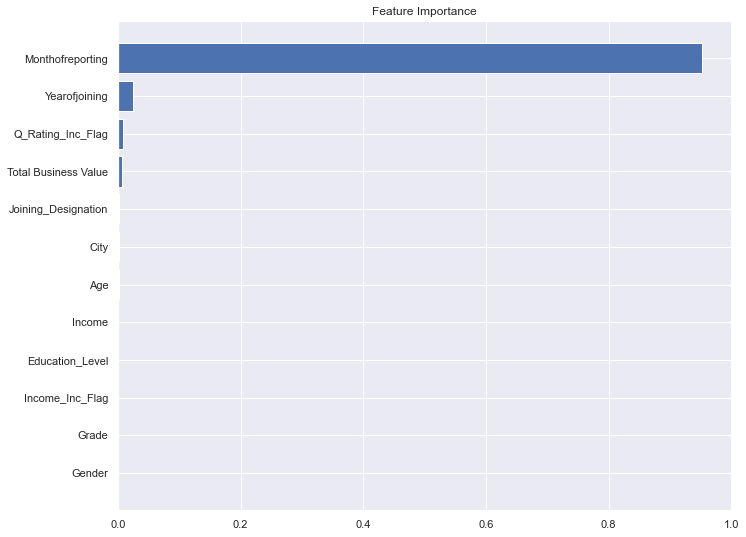

In [154]:
feature_importance = XGB_model_1.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(11, 9))

plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(X_sm.columns)[sorted_idx])
plt.title("Feature Importance")

In [160]:
jupyter -nbconvert --to PDFviaHTML ola_driver_attrition.ipynb

SyntaxError: invalid syntax (<ipython-input-160-f3249d947e2b>, line 1)